# Model Creator

## How to Use
1. After labeling your images in IBM Cloud Annotations, export your file as CreateML.
<img src="https://github.com/SamuelFolledo/Convolutional-Neural-Network-Practice/blob/master/static/exportAsCreateML.png" width="700">

2. Open terminal and change directory to this project
3. For best practices, ensure Python's virtualenv is installed which will help us create an isolated Python environment.

    `pip install virtualenv`


4. Start virtual environment and install packages we need.
    - Create virtual environment
    
        `virtualenv TuriSample`
    
    - Run the environment
    
        `source bin/activate`
    
    - Install TuriCreate and JupyterNotebook
    
        `pip install turicreate`
    
        `pip install jupyter`
    
    
5. Open JupyterNotebook, a Python editor which will open in your browser.

    `jupyter notebook`


6. Unzip the file downloaded from IBM Cloud Annotations and you should see a folder like *project-name-bucket*
7. Rename the folder to **Images**
7. Open the Images folder, look for **annotations.json** and move it outside of the folder. Your folder should look like the image below.
<img src="https://github.com/SamuelFolledo/Convolutional-Neural-Network-Practice/blob/master/static/folderSetUp.png?raw=true" width="700">

## Create a `.csv` file from an `annotations.json` and format in a way TuriCreate can understand and create a model from

In [1]:
import json
import csv
import os

jsonFileName = "annotations.json"

projectDirectory = os.getcwd() #get currrent working directory
imagesDirectory = projectDirectory + "/Images" # directory path where all our labeled images is contained

def format_json_to_csv():
    #read json
    with open(jsonFileName) as f:
        imagesDictionary = json.load(f)
    
    #create a csv to write on
    with open('annotations.csv', 'w', newline='') as csvfile:
        writer = csv.writer(csvfile, escapechar=' ', quoting=csv.QUOTE_NONE)
        writer.writerow(["path,annotations"])
        for imageDict in imagesDictionary: # start converting each images
            # add (path) first column
            imageName = imageDict["image"]
            imagePath = "{}/{}".format(imagesDirectory, imageName)
            row = imagePath
            
            # START annotation (second column)
            row += ",\"["
            for index, labelDictionary in enumerate(imageDict["annotations"]): # loop through each label in each images
                labelDictionary["type"] = "rectangle" #add shape type
                labelString = json.dumps(labelDictionary) #converts dictionary into string
#                 if labelDictionary["label"] == "Untitled Label": #handle mislabeled or untitled labels
#                     labelDictionary["label"] = "unknown"
#                     labelString = json.dumps(labelDictionary)
                singleQuotedString = labelString.replace('"', "\'") #turn labelString's double quotes to single quotes
                row += singleQuotedString
                if index != len(imageDict["annotations"]) - 1: #while not the last annotation, add comma
                    row += ","
            row += "]\""
            print(row)
            writer.writerow([row])

format_json_to_csv()

/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/28483aab-c516-4744-88e9-7b0e7eef874e.jpg,"[{'label': 'clock', 'coordinates': {'x': 274, 'y': 531, 'width': 474, 'height': 495}, 'type': 'rectangle'},{'label': 'mac mini', 'coordinates': {'x': 750, 'y': 1044, 'width': 750, 'height': 738}, 'type': 'rectangle'}]"
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/3d0915ec-dd30-4cf9-b78e-f6562bf990d6.jpg,"[{'label': 'clock', 'coordinates': {'x': 485, 'y': 658, 'width': 738, 'height': 422}, 'type': 'rectangle'}]"
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/d838d3a7-1390-4c18-bf2d-67cb30065006.jpg,"[{'label': 'yellow sticky note', 'coordinates': {'x': 731, 'y': 508, 'width': 460, 'height': 438}, 'type': 'rectangle'},{'label': 'pink sticky note', 'coordinates': {'x': 357, 'y': 1033, 'width': 586, 'height': 596}, 'type': 'rectangle'}]"
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/3c5456a0-874a-4556-b96c-9b6b85

# Machine Learning Model Creator

Train and create an ML model using [Convolutional Neural Network](https://en.wikipedia.org/wiki/Convolutional_neural_network) class

**Make sure we have the following files and directories:**
- **annotations.json** - labeled images
- **Images directory** - folder which contains all the labeled images

In [2]:
import turicreate as tc

## Load Images

In [3]:
images = tc.image_analysis.load_images("Images")
images

path,image
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125


,path,image
0,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/00ef22e9-c1ce-4197-b03d-e62504234197.jpg,
1,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/03688615-38a4-4a00-b032-b5e828efd586.jpg,
2,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/06d10302-d620-4060-a8e1-718840b35833.jpg,
3,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/1bca43de-464b-4366-bcf2-214d5b58ab1b.jpg,
4,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/20710b47-d0ac-4042-a9cb-a5621505d2b6.jpg,
5,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/23929162-845d-4945-97c8-a714172f6060.jpg,
6,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/266c07ad-adc8-4bd3-8375-96487e54a294.jpg,
7,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/26856a93-d3a1-4c07-98a5-d3e911de8096.jpg,
8,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/28483aab-c516-4744-88e9-7b0e7eef874e.jpg,
9,/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/Images/2a3c84a8-2a3d-44ca-8d74-4d0d0a1135d2.jpg,

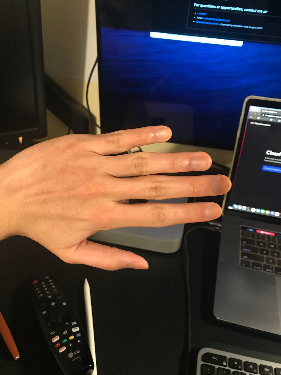
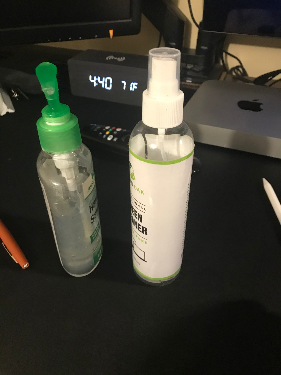
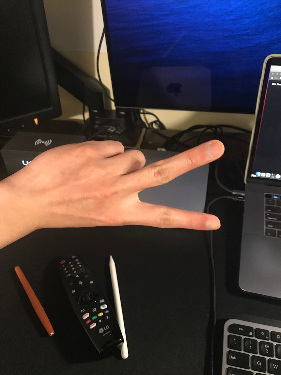
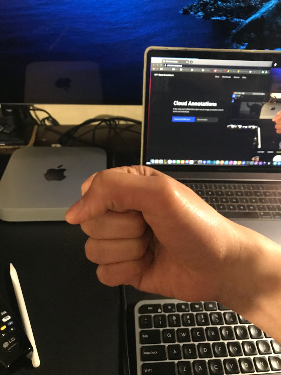
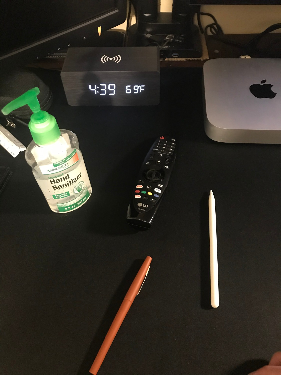
...
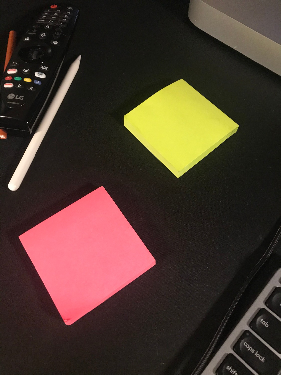
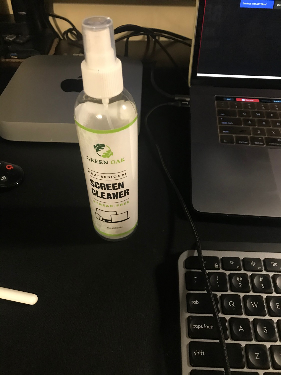
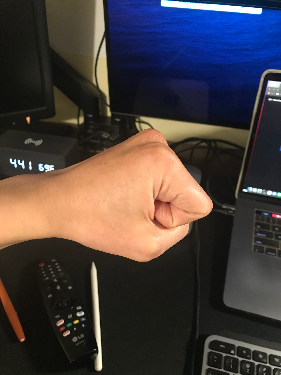
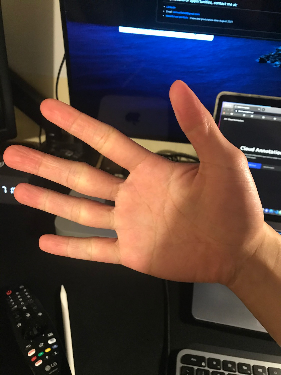
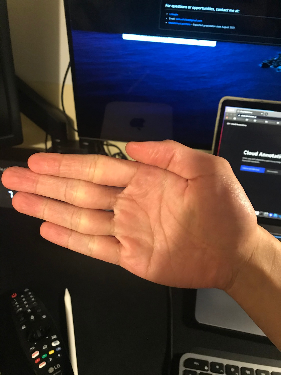

In [4]:
# images.explore() # show all images

## Load Annotations.csv

In [5]:
annotations = tc.SFrame.read_csv("annotations.csv")
annotations.head()

Finished parsing file /Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/annotations.csv

Parsing completed. Parsed 53 lines in 0.036439 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,list]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ML/ML_Model_Env/annotations.csv

Parsing completed. Parsed 53 lines in 0.008773 secs.

path,annotations
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'clock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'clock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'rock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'rock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,"[{'label': 'scissor','coordinates': {'x': ..."


## Joining SFrames
To be able to train your model, you have to join both SFrames (annotations and images).

In [6]:
joined_sframe = images.join(annotations)
joined_sframe

path,image,annotations
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'clock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'clock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'rock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'rock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."


## Training
Split dataframe. 80% of the rows/samples will be used for training and the rest will be for testing our model

In [7]:
training_sframe, testing_sframe = joined_sframe.random_split(0.8)
training_sframe

path,image,annotations
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'clock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'clock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'rock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'rock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'paper','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'paper','coordinates': {'x': ..."


In [8]:
testing_sframe

path,image,annotations
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'yellowsticky note', ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'paper','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'paper','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'scissor','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'rock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'clock','coordinates': {'x': ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1500 Width: 1125,"[{'label': 'remote','coordinates': {'x': 77, ..."
/Users/samuelfolledo/Desktop/Custom_AI_in_iOS/ ...,Height: 1125 Width: 1500,"[{'label': 'mouse','coordinates': {'x': ..."


## Training SFrame
To train a sample model, we will use the object_detector toolkit and the previously created training_sframe , with 50 iterations

This model will not have high accuracy. **To get better accuracy, you would need to create a model with at least 300 iterations or more**, possibly on more pictures. Note, this can take time

In [9]:
max_iterations = 200
model_20 = tc.object_detector.create(training_sframe, feature="image", annotations="annotations", max_iterations=max_iterations)

Using GPU ("AMD Radeon Pro 450") to create model.

Setting 'batch_size' to 16

+--------------+--------------+--------------+

| Iteration    | Loss         | Elapsed Time |

+--------------+--------------+--------------+

| 1            | 9.30318      | 2.54s        |

| 2            | 9.47991      | 3.52s        |

| 3            | 9.59094      | 4.42s        |

| 4            | 9.70672      | 5.79s        |

| 5            | 9.75186      | 6.85s        |

| 10           | 9.71166      | 11.85s       |

| 15           | 9.52568      | 16.50s       |

| 20           | 9.29732      | 21.46s       |

| 25           | 8.94334      | 26.06s       |

| 30           | 8.54466      | 30.66s       |

| 35           | 8.16667      | 35.71s       |

| 40           | 7.46447      | 40.35s       |

| 45           | 7.10035      | 46.25s       |

| 50           | 6.66359      | 51.79s       |

| 55           | 6.13368      | 56.51s       |

| 60           | 5.47078      | 1m 1s        |

| 65           | 5.34672      | 1m 5s        |

| 70           | 5.39055      | 1m 10s       |

| 75           | 5.29774      | 1m 15s       |

| 80           | 4.91877      | 1m 19s       |

| 85           | 4.93737      | 1m 24s       |

| 90           | 4.847        | 1m 29s       |

| 95           | 4.71741      | 1m 34s       |

| 100          | 4.5012       | 1m 38s       |

| 105          | 4.46325      | 1m 43s       |

| 110          | 4.42033      | 1m 48s       |

| 115          | 4.48691      | 1m 53s       |

| 120          | 4.09863      | 1m 58s       |

| 125          | 4.18735      | 2m 3s        |

| 130          | 4.39068      | 2m 7s        |

| 135          | 4.20944      | 2m 12s       |

| 140          | 3.90989      | 2m 17s       |

| 145          | 3.81876      | 2m 23s       |

| 150          | 3.81393      | 2m 28s       |

| 155          | 3.79654      | 2m 33s       |

| 160          | 3.99808      | 2m 38s       |

| 165          | 3.78218      | 2m 43s       |

| 170          | 3.5687       | 2m 48s       |

| 175          | 3.80794      | 2m 52s       |

| 180          | 3.63113      | 2m 57s       |

| 185          | 3.90578      | 3m 2s        |

| 190          | 3.86156      | 3m 7s        |

| 195          | 3.58835      | 3m 12s       |

| 200          | 3.61771      | 3m 16s       |

+--------------+--------------+--------------+

In [10]:
model_20

Class                                    : ObjectDetector

Schema
------
Model                                    : darknet-yolo
Number of classes                        : 15
Input image shape                        : [3, 416, 416]

Training summary
----------------
Training time                            : 3m 17s
Training epochs                          : 74
Training iterations                      : 200
Number of examples (images)              : 43
Number of bounding boxes (instances)     : 73
Final loss (specific to model)           : 3.6177

In [11]:
# model_1200 = tc.object_detector.create(training_sframe, feature="image", annotations="annotations", max_iterations=1200)

In [12]:
# model_1200

## Export Model

In [13]:
# model_1200.export_coreml("my_custom_model.mlmodel")

In [14]:
# metrics_1200 = model_1200.evaluate(testing_sframe)
# metrics_1200

In [15]:
metrics_20 = model_20.evaluate(testing_sframe)
metrics_20

{'average_precision_50': {'apple  pencil': 0.5,
  'clock': 1.0,
  'hand  sanitizer': 0.0,
  'keyboard': 1.0,
  'mac  mini': 0.4833333492279053,
  'macbook': 1.0,
  'mouse': 0.0,
  'paper': 0.5714285969734192,
  'pen': 0.0,
  'pink  sticky  note': 1.0,
  'remote': 0.1538461595773697,
  'rock': 1.0,
  'scissor': 0.8095238208770752,
  'spray  bottle': 0.0,
  'yellow  sticky  note': 0.25},
 'mean_average_precision_50': 0.5178754925727844}

### Export out .mlmodel

In [17]:
model_20.export_coreml("my_custom_model.mlmodel")